In [16]:
# Operation
import pandas as pd
import numpy as np
import pickle as pkl
from sklearn.pipeline import Pipeline
import joblib
import warnings

# PLotting
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

## Connection to SQL
import pyodbc

# Preprocessing
from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import chi2

from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import learning_curve
from sklearn.model_selection import permutation_test_score
from sklearn.feature_selection import SelectKBest
from sklearn.preprocessing import Imputer
from pandas import qcut


# Feature Selection
from sklearn.feature_selection import SelectFromModel

# Models
from sklearn.decomposition import PCA


# Approximation
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import NearestNeighbors

# Regression Based
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.svm import LinearSVC
from sklearn.svm import SVC

# Tree Based
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier

from sklearn.neighbors import KNeighborsClassifier



# Gradient Boosting
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

# Neural Network

from sklearn.neural_network import MLPClassifier
from sklearn.neural_network import MLPRegressor

# Ensemble
from sklearn.ensemble import VotingClassifier


## Evaluation Metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import auc
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score


import io
from sklearn.tree import export_graphviz
import pydotplus
from pandas import qcut

In [2]:
def outlier_detection_(X):
    Summary = X.describe(include='all', percentiles=[.01,.25,.50,.75,.90,.95,.99])

    Unique_Values = {}
    for i in np.arange(len(X.columns)):
        m = X.columns[i]
        n = len(X.iloc[:,i].value_counts())
        dict2 = { m : n }
        Unique_Values.update(dict2)

    Unique = pd.Series(Unique_Values)

    Nan_Values = {}
    for i in np.arange(len(X.columns)):
        m = X.columns[i]
        n = X.iloc[:,i].isnull().sum()
        dict2 = { m : n }
        Nan_Values.update(dict2)

    Nan1 = pd.Series(Nan_Values)

    data_Type = {}
    for i in np.arange(len(X.columns)):
        m = X.columns[i]
        n = X.iloc[:,i].dtype
        dict2 = { m : n }
        data_Type.update(dict2)

    data_Type_final = pd.Series(data_Type)

    Skewness = {}
    for i in np.arange(len(X.columns)):
        m = X.columns[i]
        n = X.iloc[:,i].skew()
        dict2 = { m : n }
        Skewness.update(dict2)

    Skewness_final = pd.Series(Skewness)


    Summary_1 = pd.DataFrame({'Unique Count': Unique, 
                            'Nan Values' : Nan1,
                            "Data Type" : data_Type_final,
                             'Skewness': Skewness_final} 
                          )

    ## inner join them
    Summary_2 = pd.concat([Summary.T,Summary_1],axis=1, join='inner')


    ## Replace Denominotor with zero
    Summary_2.loc[Summary_2['count'] == 0, 'count'] = np.nan

    ## Avoid division by zero
    # Summary_2["[95% : 99%] (Sigma)"] = Summary_2["95%"].div(Summary_2['99%'])
    # Summary_2.loc[~np.isfinite(Summary_2["[95% : 99%] (Sigma)"]), "[95% : 99%] (Sigma)"] = np.nan

    Summary_2['Pct % Missing Values'] = Summary_2['Nan Values'].div(Summary_2['count'].max())*100
    Summary_2.loc[~np.isfinite(Summary_2["Pct % Missing Values"]), "Pct % Missing Values"] = 100


    X2 = Summary_2
    return X2

### Data Load 

In [3]:
import pandas as pd
import random

# The data to load
f = "Data\MI_Cross_Sell_Monthly.csv"

# Count the lines
num_lines = sum(1 for l in open(f))

# Sample size - in this case ~10%
pct = 20
size = int(num_lines / 100 * pct)

# The row indices to skip - make sure 0 is not included to keep the header!
skip_idx = random.sample(range(1, num_lines), num_lines - size)

# Read the data
data = pd.read_csv(f, skiprows=skip_idx, sep="|", index_col='SUBSCRIBER_ARRANGEMENT_ID' )

### Define X & Y

In [4]:
# Drop Non-related Columns (future Variables)
data.drop([ 'DATA_DAY', 
            'MONTH_TAG',
            'RANK',
            'LAST_DAY',
            'LAST_DEVICE_CHANGE_DATE',
            'MI_REVENUE_MTH_1',
            'MI_REVENUE_MTH_2',
            'MI_REV_VOL_PURCHASE_MTH_1',
            'MI_REV_MONTHLY_MTH_1',
            'MI_REV_WEEKLY_MTH_1',
            'MI_REV_DAILY_MTH_1',
            'MI_REV_VOL_PURCHASE_MTH_2',
            'MI_REV_MONTHLY_MTH_2',
            'MI_REV_WEEKLY_MTH_2',
            'MI_REV_DAILY_MTH_2',
            'MI_DAILY_TAG',
            'MI_WEEKLY_TAG',
            'MI_MONTHLY_TAG',
            'MI_VOL_PURCHASE_TAG',
            'MI_REVENUE_TAG',
            'MI_REVENUE_RM10_ABOVE',], axis=1 , inplace=True)

In [5]:
y_select = data.iloc[:,-6:]
data = data.iloc[:,:-6]

In [6]:
X = data
y = y_select.iloc[:,-1]

In [7]:
print('Shape Data Set   :',data.shape)
print('Shape Target Set :',y_select.shape)

Shape Data Set   : (269972, 709)
Shape Target Set : (269972, 6)


### Data Summary Table

In [8]:
## Only Numeric Data
data1 = data._get_numeric_data()

Summary = data.describe(include='all', percentiles=[.25,.50,.75,.90,.95,.99])

Unique_Values = {}
for i in np.arange(len(data.columns)):
    m = data.columns[i]
    n = len(data.iloc[:,i].value_counts())
    dict2 = { m : n }
    Unique_Values.update(dict2)
    
Unique = pd.Series(Unique_Values)

Nan_Values = {}
for i in np.arange(len(data.columns)):
    m = data.columns[i]
    n = data.iloc[:,i].isnull().sum()
    dict2 = { m : n }
    Nan_Values.update(dict2)
    
Nan1 = pd.Series(Nan_Values)

Data_Type = {}
for i in np.arange(len(data.columns)):
    m = data.columns[i]
    n = data.iloc[:,i].dtype
    dict2 = { m : n }
    Data_Type.update(dict2)
    
Data_Type_final = pd.Series(Data_Type)

Skewness = {}
for i in np.arange(len(data1.columns)):
    m = data1.columns[i]
    n = data1.iloc[:,i].skew()
    dict2 = { m : n }
    Skewness.update(dict2)
    
Skewness_final = pd.Series(Skewness)

    
Summary_1 = pd.DataFrame({'Unique Count': Unique, 
                        'Nan Values' : Nan1,
                        "Data Type" : Data_Type_final,
                         'Skewness': Skewness_final} 
                      )

## inner join them
Summary_2 = pd.concat([Summary.T,Summary_1],axis=1, join='inner')

## Replace Denominotor with zero
Summary_2.loc[Summary_2['count'] == 0, 'count'] = np.nan

## Avoid division by zero
# Summary_2["[95% : 99%] (Sigma)"] = Summary_2["95%"].div(Summary_2['99%'])
# Summary_2.loc[~np.isfinite(Summary_2["[95% : 99%] (Sigma)"]), "[95% : 99%] (Sigma)"] = np.nan

Summary_2['Pct % Missing Values'] = Summary_2['Nan Values'].div(Summary_2['count'].max())*100
Summary_2.loc[~np.isfinite(Summary_2["Pct % Missing Values"]), "Pct % Missing Values"] = 100

Summary_2['Single Category %'] = Summary_2['freq'].div(Summary_2['count'])*100

In [61]:
# Export to CSV (Table too big)
Summary_2.to_csv('Summary Statistics/1_Summary_stats_uplift.csv')

## Outlier Treatment

### Remove missing values greater than 30%

In [9]:
missing_greater_30_pct = Summary_2[Summary_2['Pct % Missing Values'] > 30].index.tolist()
data.drop(missing_greater_30_pct, axis=1, inplace=True)

### Visualize with Historgrams

In [ ]:
data1 = data._get_numeric_data()

plt.rcParams['font.size'] = 16
plt.style.use('seaborn-white')

for i in range(len(data1.columns)):
    plt.figure(i, figsize=(16,8))
    array_1 = data1[data1.columns[i]][data1[data1.columns[i]].notnull()]
    ax = sns.distplot(array_1, hist_kws=dict(edgecolor="k", linewidth=2))
#     plt.hist(data1[data1.columns[i]], bins=20, edgecolor='black', linewidth=1.2)
    plt.title('Histogram Plot of {0}'.format(data1.columns[i]))
    plt.xlabel(data1.columns[i])
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.figure(i).savefig('Histogram Plot/1_O_Combined/{0}.Histogram Plot of {1}.png'.format(i,data1.columns[i]))

In [15]:
del data1

### Separate into Categorical and Numeric Data

Numerical Data

In [10]:
data_numeric = data._get_numeric_data()

Categorical Data 

In [11]:
cols = list(data_numeric.columns)
cols2 = list(data.columns)

## Find Category Columns
cols_category = [item for item in cols2 if item not in cols]
data_cateogry = data.loc[:,cols_category] 

In [12]:
print("Numeric Data Shape     : ", data_numeric.shape)
print("Categorical Data Shape : ", data_cateogry.shape)

Numeric Data Shape     :  (269972, 503)
Categorical Data Shape :  (269972, 23)


In [ ]:
del data

### Impute Missing Variables

In [ ]:
## Impute Missing Variables 
# data_numeric.fillna(0, inplace=True)

In [13]:
# Impute with mean (Columns Only)
# for i in np.arange(len(data_numeric.columns)):
imp = Imputer(missing_values=np.nan, strategy='median', axis=1)
data_numeric = pd.DataFrame(imp.fit_transform(data_numeric), columns=data_numeric.columns.tolist(), index=data_numeric.index)

In [73]:
# Export to CSV (Table too big)
outlier_detection_(data_numeric).to_csv('Summary Statistics/Combined/1_Summary_stats_missing_filled.csv')

### Remove 99% Percentile = 0

In [14]:
Ptile_99_zero = (data_numeric.quantile(.99) != 0)
Index_of_Ptile_99_non_zero =  np.where(Ptile_99_zero.tolist())[0].tolist()

data_numeric = data_numeric.iloc[:,Index_of_Ptile_99_non_zero]

In [33]:
print("Numeric Data Treated Shape: ", data_numeric.shape)

Numeric Data Treated Shape:  (404959, 464)


### Remove Low Variance Variables

In [15]:
low_vairance_removal = VarianceThreshold(.1)
low_vairance_removal.fit_transform(data_numeric)
Columns_remaining = list(low_vairance_removal.get_support(indices=True))

data_numeric = data_numeric.iloc[:,Columns_remaining]

In [16]:
print("Numeric Data Treated Shape: ", data_numeric.shape)

Numeric Data Treated Shape:  (269972, 398)


99th Percentile Treatment

In [17]:
## 99th Percentile Treatment

ptile_99 = data_numeric.quantile(0.99)
outliers_99_ptile = (data_numeric > ptile_99)

data_treated_outlier = data_numeric.mask(outliers_99_ptile, ptile_99, axis=1)

1st Percentile Treatment

In [18]:
## 1st Percentile Treatment

ptile_01 = data_treated_outlier.quantile(0.01)
outliers_01_ptile = (data_treated_outlier < ptile_01)

data_treated_outlier = data_treated_outlier.mask(outliers_01_ptile, ptile_01, axis=1)

In [80]:
# Export to CSV (Table too big)
outlier_detection_(data_treated_outlier).to_csv('Summary Statistics/Combined/1_Summary_stats_outlier_treated.csv')

### Plot distribution

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


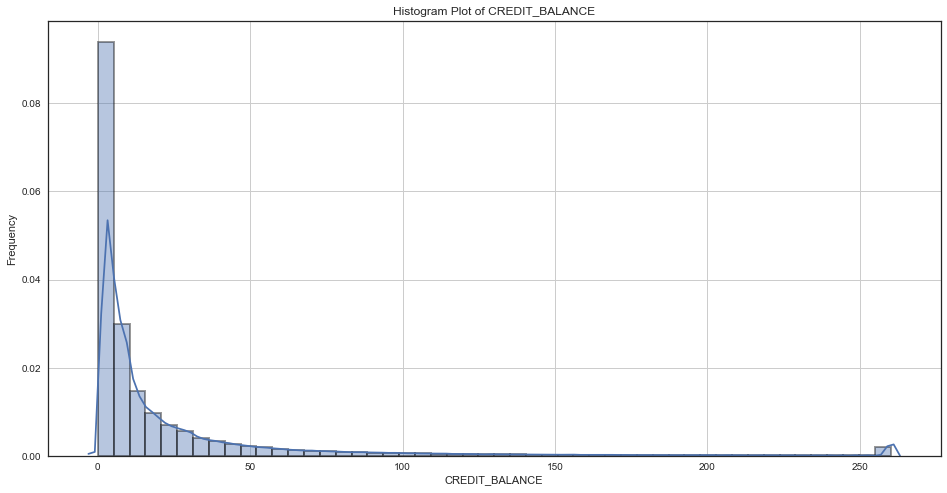

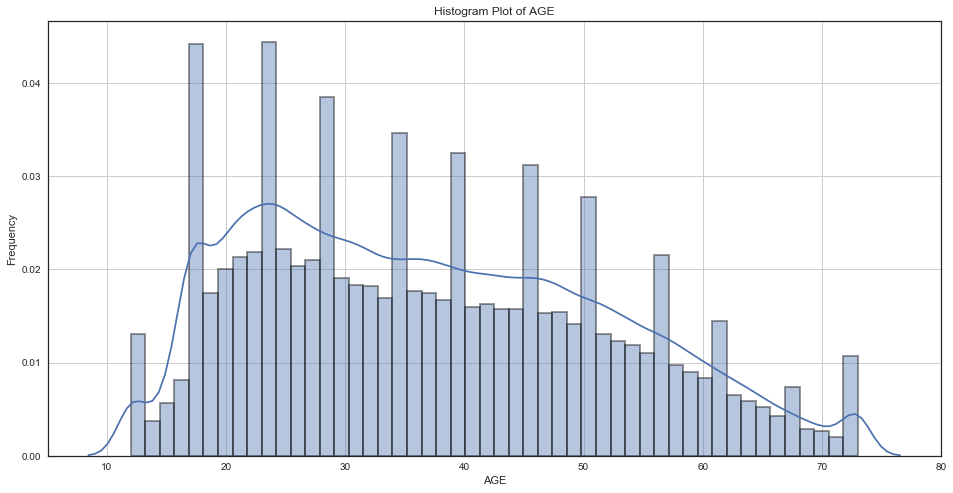

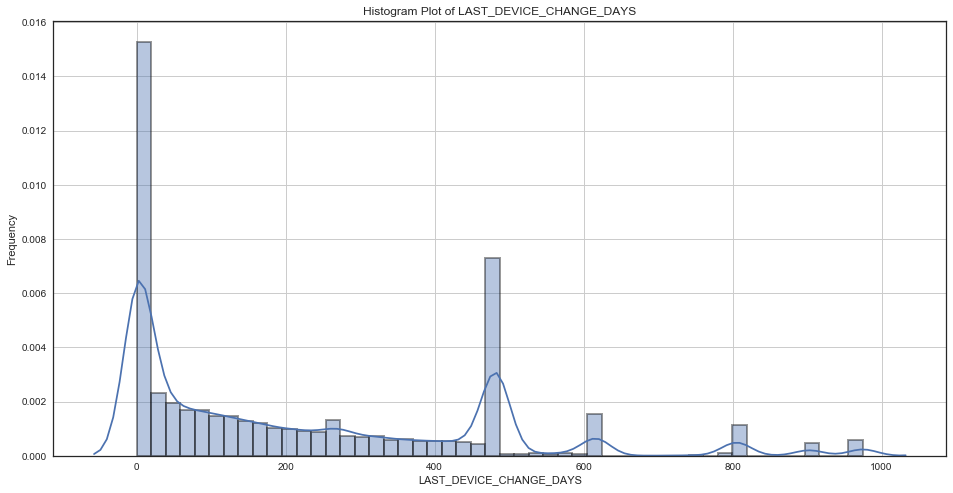

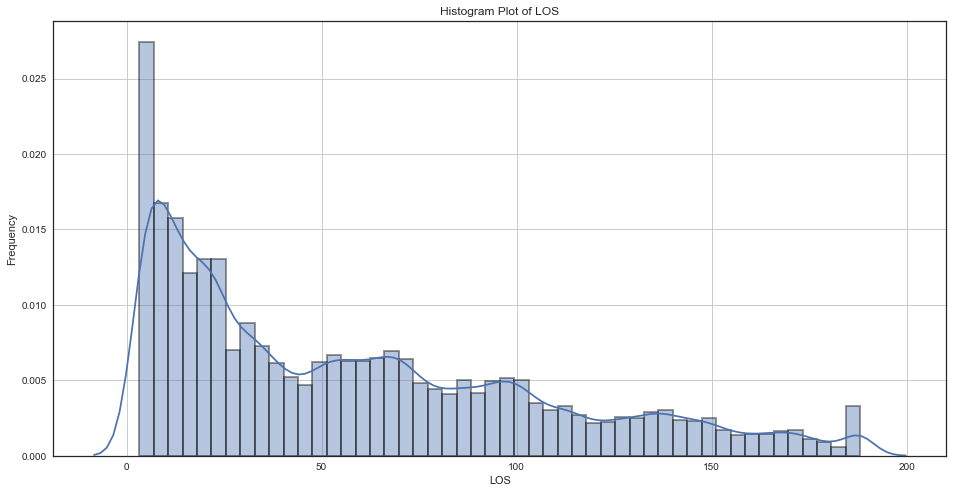

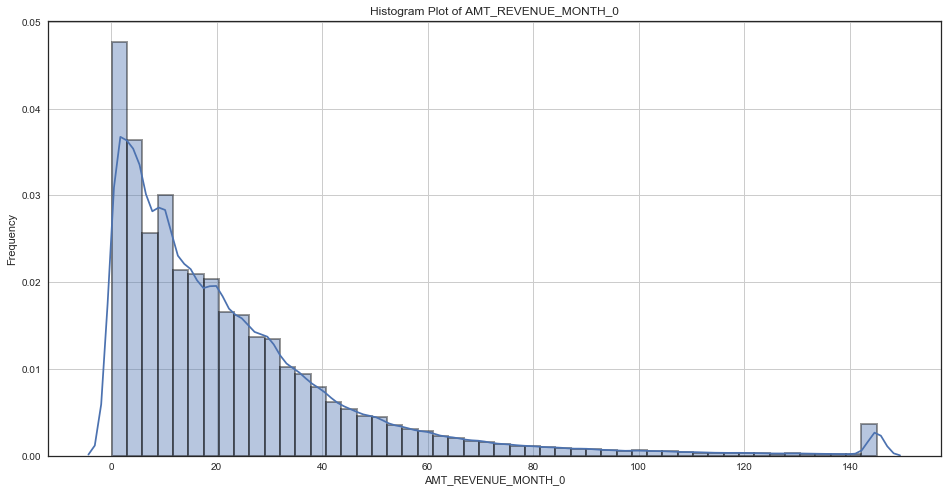

...

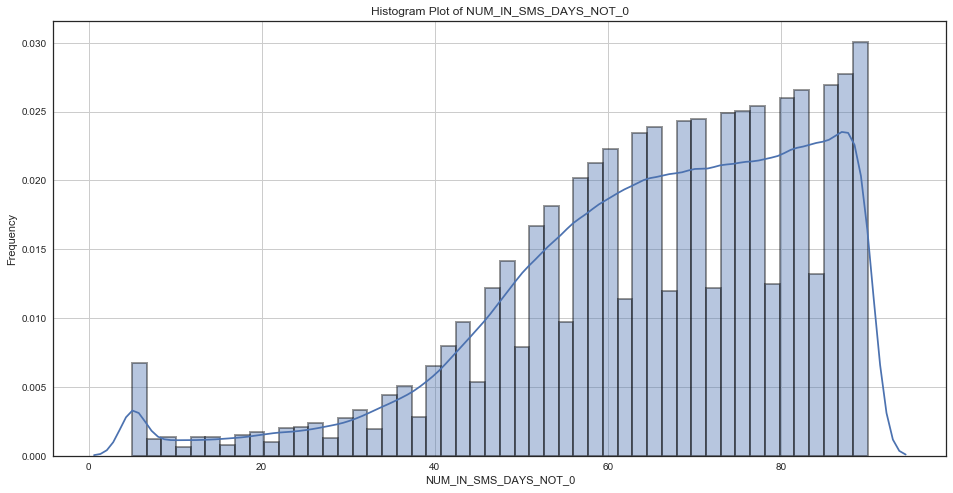

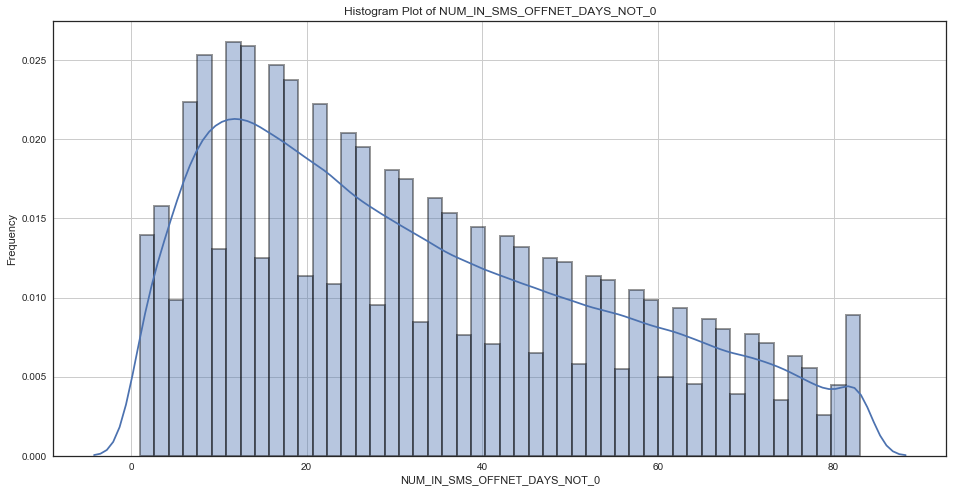

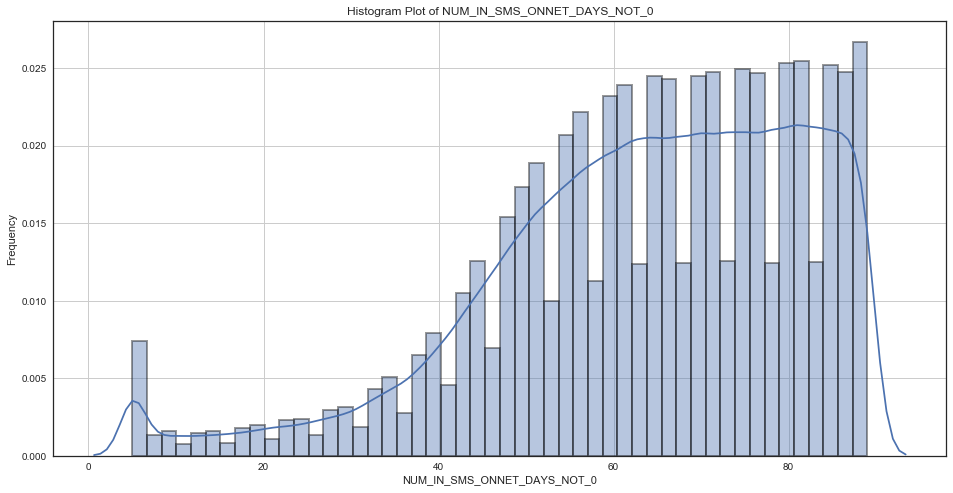

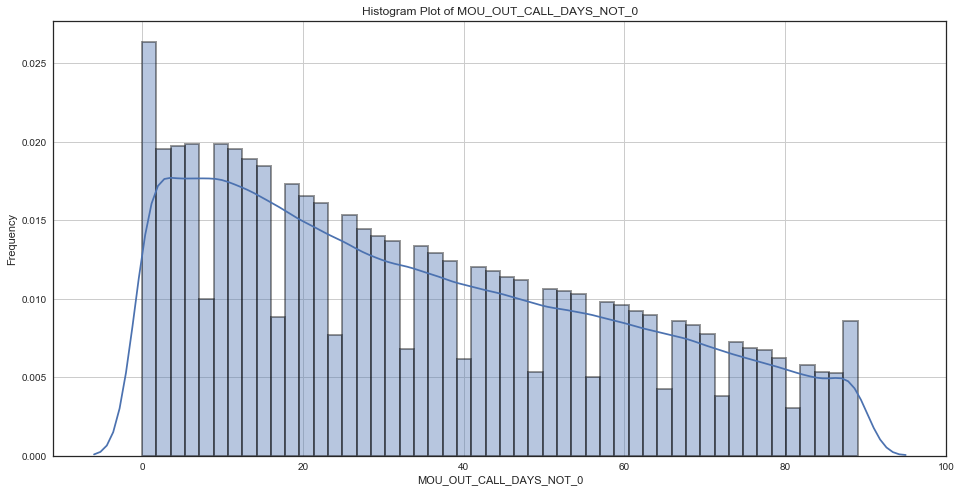

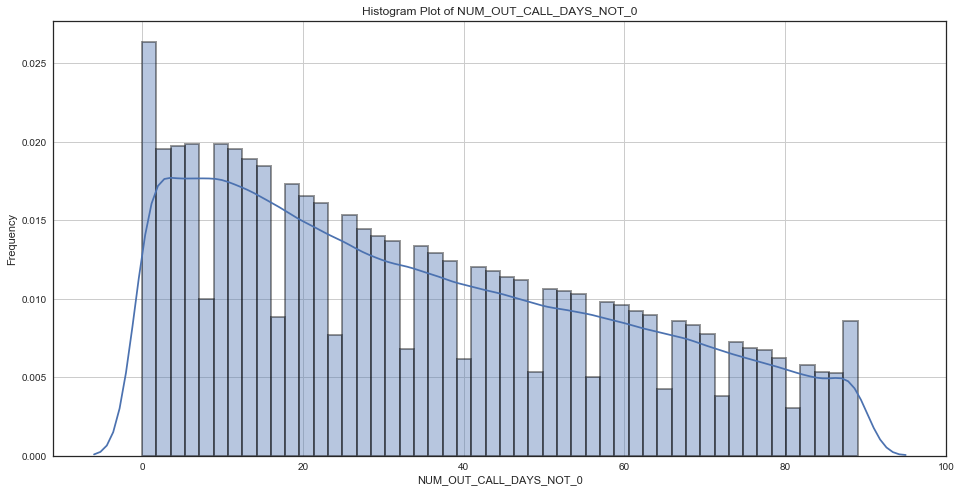

In [81]:
data1 = data_treated_outlier

plt.rcParams['font.size'] = 16
plt.style.use('seaborn-white')

for i in range(len(data1.columns)):
    plt.figure(i, figsize=(16,8))
    array_1 = data1[data1.columns[i]][data1[data1.columns[i]].notnull()]
    ax = sns.distplot(array_1, hist_kws=dict(edgecolor="k", linewidth=2))
#     plt.hist(data1[data1.columns[i]], bins=20, edgecolor='black', linewidth=1.2)
    plt.title('Histogram Plot of {0}'.format(data1.columns[i]))
    plt.xlabel(data1.columns[i])
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.figure(i).savefig('Histogram Plot/2_O_Combined/{0}.Histogram Plot of {1}.png'.format(i,data1.columns[i]))

### Scale Data

In [19]:
# Standard Scaler
data_scaled = StandardScaler().fit_transform(data_treated_outlier)

## Rename Columns and Index
data_scaled = pd.DataFrame(data_scaled, columns=list(data_treated_outlier.columns), index=data_treated_outlier.index.tolist())

In [39]:
## Output Standardize Data 
Standard_output = outlier_detection_(data_scaled)

Standard_output.to_csv('Summary Statistics/Combined/2_Summary_stats_Standardize_Treated.csv')

### Combine with Categorical data  

In [20]:
## Combine categorival and numerical data 
data_treated = pd.concat([data_scaled, data_cateogry],axis=1 ,join_axes=[data_cateogry.index] )

In [21]:
## Dummy variables
data_treated_dummies = pd.get_dummies(data_treated,drop_first=True)

### Multi-Colinearity

Pearson (R) not R^2

In [ ]:
Multi_Colinear = data_treated_dummies.corr(method='pearson')
Multi_Colinear.to_csv('Summary Statistics/Control/3_Multi_Colinearity_plot.csv')

In [42]:
def correlation(dataset, threshold):
    col_corr = set() # Set of all the names of deleted columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if corr_matrix.iloc[i, j] >= threshold and corr_matrix.iloc[i, j] < 1.00:
                colname = corr_matrix.columns[i] # getting the name of column
                col_corr.add(colname)
                if colname in dataset.columns:
                    del dataset[colname] # deleting the column from the dataset

In [43]:
correlation(data_treated_dummies ,0.8)

### Save & Load Point

In [22]:
# Save DataFrame
data_treated_dummies.to_pickle('saved_treated_scaled_dummy_data_combined')

In [23]:
y.to_pickle('y_target_combined')

In [3]:
# Load DataFrame
data_treated_dummies = pd.read_pickle('saved_treated_scaled_dummy_data_combined')

In [4]:
y = pd.read_pickle('y_target_combined')

In [5]:
X = data_treated_dummies

In [6]:
del data_treated_dummies

## Feature Selection by group type

X & Y Control

In [7]:
filename = 'classifier/features_controlled.pkl'
features_controlled = pkl.load(open(filename, 'rb'))
print('Features Loaded')

Features Loaded


In [8]:
X_control = X.loc[:,features_controlled]

In [9]:
X_control.shape

(269972, 141)

X & Y Non-Control

In [10]:
features_non_controlled = pkl.load(open('classifier/features_non_controlled.pkl', 'rb'))

In [11]:
X_non_control = X.loc[:,features_non_controlled]

In [12]:
X_non_control.shape

(269972, 151)

## Split Data

a) Controlled

    i) Control Ensemble Model

In [13]:
filename = 'classifier/finalized_model.pkl'
# load the model from disk
clf_control = pkl.load(open(filename, 'rb'))
result = clf_control.score(X_control, y)
print(result)

0.579582327056


b) Non Controlled

    i) Non-Control Ensemble Model

In [14]:
filename = 'classifier/finalized_model_non_control.pkl'
# load the model from disk
clf_non_control = pkl.load(open(filename, 'rb'))
result = clf_non_control.score(X_non_control, y)
print(result)

0.718478212555


### Take Up Rate

In [46]:
df_takeup_0 = pd.DataFrame({'class' : y,
                    'probability_non_control' : clf_non_control.predict_proba(X_non_control)[:,1].tolist(),
                    'probability_control' : clf_control.predict_proba(X_control)[:,1].tolist()},
                   columns=['class','probability_non_control','probability_control'])
df_takeup_0['prob_diff'] = df_takeup_0.probability_non_control - df_takeup_0.probability_control
df_takeup_0.head()

,class,probability_non_control,probability_control,prob_diff
SUBSCRIBER_ARRANGEMENT_ID,,,,
65433153,0,0.422455,0.518918,-0.096463
65433343,0,0.355167,0.467868,-0.112701
65430764,0,0.253204,0.423385,-0.170181
65432144,0,0.363970,0.402711,-0.038741
65437477,0,0.624421,0.572460,0.051961


In [53]:
num_bins = 10
num_bins_plus_one = num_bins+1

# Assign Percentile
df_takeup_0['percentile_non_control'] = pd.qcut(df_takeup_0.probability_non_control,
                                                q=num_bins,
                                                labels=np.arange(1,num_bins_plus_one)[::-1].tolist())

df_takeup_0['percentile_control'] = pd.qcut(df_takeup_0.probability_control,
                                            q=num_bins,
                                            labels=np.arange(1,num_bins_plus_one)[::-1].tolist())

df_takeup_0['percentile_uplift'] = pd.qcut(df_takeup_0.prob_diff,
                                            q=num_bins,
                                            labels=np.arange(1,num_bins_plus_one)[::-1].tolist())

In [54]:
df_takeup_0.sort_values(by='probability_non_control', ascending=False).head()

,class,probability_non_control,probability_control,prob_diff,percentile_non_control,percentile_control,percentile_uplift
SUBSCRIBER_ARRANGEMENT_ID,,,,,,,
149774368,0,0.835247,0.741149,0.094097,1,1,1
149160986,0,0.834150,0.748115,0.086036,1,1,1
149394581,0,0.834123,0.744922,0.089201,1,1,1
149824994,0,0.833418,0.755020,0.078399,1,1,1
139230590,0,0.831685,0.723400,0.108285,1,1,1


In [58]:
table = pd.pivot_table(df_takeup_0, 
                       values='class', 
                       index='percentile_non_control', 
                       columns='percentile_control', 
                       aggfunc=np.sum)


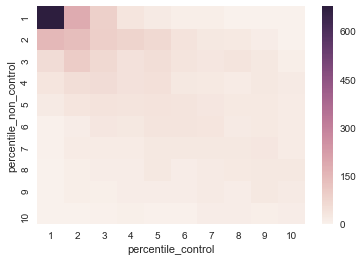

In [60]:
sns.heatmap(table)

In [59]:
table

percentile_control,1,2,3,4,5,6,7,8,9,10
percentile_non_control,,,,,,,,,,
1,677,185,88,32,19,8,9,1,2,0
2,152,136,93,77,64,38,25,23,15,2
3,58,99,66,44,55,35,30,35,28,8
4,34,53,57,43,47,25,23,17,24,20
5,19,33,39,35,40,37,30,22,23,18
6,5,15,31,26,36,36,34,20,22,18
7,4,16,17,17,24,25,25,28,31,17
8,0,8,13,13,25,12,19,22,26,25
9,1,9,6,12,13,13,19,14,25,20


In [29]:
df_takeup_0['prob_diff'].describe(include='all', percentiles=[0.01,0.05,.25,.50,.75,.90,.95,.99])

count    269972.000000
mean         -0.047248
std           0.083470
min          -0.381196
1%           -0.226861
5%           -0.177026
25%          -0.106376
50%          -0.052357
75%           0.009245
90%           0.068845
95%           0.097775
99%           0.144145
max           0.281604
Name: prob_diff, dtype: float64

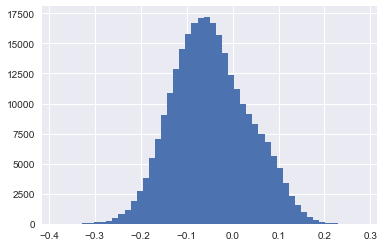

In [20]:
plt.hist(df_takeup_0.prob_diff, bins=50);

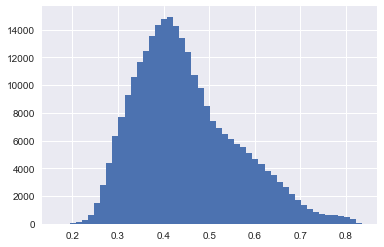

In [21]:
plt.hist(df_takeup_0.probability_non_control, bins=50);

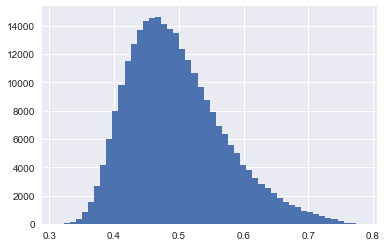

In [22]:
plt.hist(df_takeup_0.probability_control, bins=50);

In [25]:
len( df_takeup_0[(df_takeup_0.prob_diff > 0.05)] )

37888

In [26]:
len( df_takeup_0[(df_takeup_0.prob_diff > 0)] )

75570

In [94]:
len( df_takeup_0[(df_takeup_0.probability_non_control > 0.5)] )

76527

In [95]:
len( df_takeup_0[(df_takeup_0.probability_control > 0.5)] )

114525

In [38]:
df_take_up_uplift = df_takeup_0[(df_takeup_0.prob_diff> 0.05)  &  (df_takeup_0.percentile_uplift <= 3)]

In [39]:
df_take_up_uplift['prob_diff'].describe(include='all', percentiles=[0.01,0.05,.25,.50,.75,.90,.95,.99])

count    37888.000000
mean         0.091270
std          0.031652
min          0.050000
1%           0.050596
5%           0.053069
25%          0.066105
50%          0.084650
75%          0.109422
90%          0.135478
95%          0.152475
99%          0.184605
max          0.281604
Name: prob_diff, dtype: float64

In [40]:
df_take_up_uplift.head()

,class,probability_non_control,probability_control,prob_diff,percentile_non_control,percentile_control,percentile_uplift
SUBSCRIBER_ARRANGEMENT_ID,,,,,,,
65437477,0,0.624421,0.572460,0.051961,1,2,2
65430427,0,0.713342,0.566056,0.147287,1,2,1
65442804,0,0.546510,0.422973,0.123536,2,9,1
65430261,0,0.472329,0.408973,0.063356,4,10,2
65448347,0,0.531855,0.481825,0.050030,3,6,2


In [41]:
sum_non_uplift   = df_take_up_uplift.groupby(by='percentile_uplift', squeeze=True).sum().iloc[:,0]
count_non_uplift = df_take_up_uplift.groupby(by='percentile_uplift', squeeze=True).count().iloc[:,0]

In [42]:
df_take_up_uplift_1 = pd.concat([sum_non_uplift,count_non_uplift],axis=1, join='inner')

In [44]:
df_take_up_uplift_1

,class,class
percentile_uplift,,
1,760.0,26998
2,255.0,10890
3,NaN,0
4,NaN,0
5,NaN,0
6,NaN,0
7,NaN,0
8,NaN,0
9,NaN,0


In [62]:
# Count Take Up Rate
sum_non_control   = df_takeup_0.groupby(by='percentile_non_control', squeeze=True).sum().iloc[:,0]
count_non_control = df_takeup_0.groupby(by='percentile_non_control', squeeze=True).count().iloc[:,0]

sum_control   = df_takeup_0.groupby(by='percentile_control', squeeze=True).sum().iloc[:,0]
count_control = df_takeup_0.groupby(by='percentile_control', squeeze=True).count().iloc[:,0]

sum_uplift   = df_takeup_0.groupby(by='percentile_uplift', squeeze=True).sum().iloc[:,0]
count_uplift = df_takeup_0.groupby(by='percentile_uplift', squeeze=True).count().iloc[:,0]



In [63]:
df_takeup_1 = pd.concat([sum_non_control,
                         count_non_control,
                         sum_control,
                         count_control,
                         sum_uplift,
                         count_uplift], axis=1, join='inner')

In [64]:
df_takeup_1

,class,class,class,class,class,class
percentile_uplift,,,,,,
1,1021,26998,951,26998,760,26998
2,625,26997,556,26997,615,26997
3,458,26997,414,26997,452,26997
4,343,26997,305,26997,314,26997
5,296,26997,328,26997,311,26997
6,243,26997,234,26997,281,26997
7,204,26997,229,26997,238,26997
8,163,26997,196,26997,209,26997
9,132,26997,206,26997,208,26997


In [67]:
df_takeup_1['pct_takeup_non_control'] = round(df_takeup_1.iloc[:,0] / df_takeup_1.iloc[:,1] * 100, 2)
df_takeup_1['pct_takeup_control']     = round(df_takeup_1.iloc[:,2] / df_takeup_1.iloc[:,3] * 100, 2)
df_takeup_1['pct_takeup_control']     = round(df_takeup_1.iloc[:,4] / df_takeup_1.iloc[:,5] * 100, 2)

df_takeup_1['incremental_response'] = df_takeup_1.pct_takeup_non_control - df_takeup_1.pct_takeup_control
df_takeup_1.columns = ['non_control_taker', 
                       'non_control_population', 
                       'control_taker', 
                       'control_population',
                       'uplift_taker',
                       'uplift_population',
                       'pct_takeup_non_control',
                       'pct_takeup_control',
                       'incremental_response']

In [68]:
df_takeup_1

,non_control_taker,non_control_population,control_taker,control_population,uplift_taker,uplift_population,pct_takeup_non_control,pct_takeup_control,incremental_response
percentile_uplift,,,,,,,,,
1,1021,26998,951,26998,760,26998,3.78,2.82,0.96
2,625,26997,556,26997,615,26997,2.32,2.28,0.04
3,458,26997,414,26997,452,26997,1.70,1.67,0.03
4,343,26997,305,26997,314,26997,1.27,1.16,0.11
5,296,26997,328,26997,311,26997,1.10,1.15,-0.05
6,243,26997,234,26997,281,26997,0.90,1.04,-0.14
7,204,26997,229,26997,238,26997,0.76,0.88,-0.12
8,163,26997,196,26997,209,26997,0.60,0.77,-0.17
9,132,26997,206,26997,208,26997,0.49,0.77,-0.28


In [53]:
df_takeup_0.head()

,class,probability_non_control,probability_control,percentile_non_control,percentile_control,prob_diff
SUBSCRIBER_ARRANGEMENT_ID,,,,,,
65433153,0,0.422455,0.518918,6,4,-0.096463
65433343,0,0.355167,0.467868,8,7,-0.112701
65430764,0,0.253204,0.423385,10,9,-0.170181
65432144,0,0.363970,0.402711,8,10,-0.038741
65437477,0,0.624421,0.572460,1,2,0.051961


In [49]:
df_takeup_0[df_takeup_0.prob_diff > 0 && ]['class'].sum() 

1744

In [50]:
len( df_takeup_0[df_takeup_0.prob_diff > 0]['class'] )

75570

In [52]:
1744 / 75570 * 100

2.3077940981871112

In [ ]:
# Probabilties
X_test_proba = pd.DataFrame(classifier.predict_proba(X_test), index=X_test.index.tolist())
# Test Data
y_test_1 = pd.DataFrame(y_test)

# Combine them
Probability = pd.concat([y_test_1,X_test_proba ], axis=1, join_axes=[y_test_1.index])

# Rename Column
Probability.columns = ['Target','Prob_0','Prob_1']

Probability = Probability.sort_values('Prob_1', ascending=False)

from pandas import qcut

num_bins = 20
num_bins_plus_one = num_bins+1

# Assign Percentile
Probability['Percentile'] = pd.qcut(Probability.iloc[:,-1], q=num_bins, labels=np.arange(1,num_bins_plus_one)[::-1].tolist())

# Count Take Up Rate
sum_1 = Probability.groupby(by='Percentile', squeeze=True).sum().iloc[:,0]
count_1 =Probability.groupby(by='Percentile', squeeze=True).count().iloc[:,0]

Take_up = pd.concat([sum_1,count_1], axis=1, join='inner')

Take_up['Pct_Takeup'] = Take_up.iloc[:,0] / Take_up.iloc[:,1] * 100

# Insert Prevalance
Take_up['Prevalence'] = [Prevalance*100]*num_bins

In [ ]:
def header(algo, hyperparameter,hyperparameters):
    print("- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - ")
    Bold = "\033[1m"
    Underline = "\033[4m"
    end = "\033[0;0m"
    print("\n",Bold,Underline,"{}".format(algo), end )
    print(Bold,"\n Hyperparamter :", end, "\n {} \n {}" .format(hyperparameter,   hyperparameters) )
    Model_Parameter_list.append(hyperparameters)

def train_model(model):
    clf = model
    clf.fit(X_train,y_train)
    return clf
    
def metric_calculation(clf, X_train, X_test, y_train, y_test):
    X_train = X_train
    X_test  = X_test
    y_train = y_train
    y_test  = y_test
    
    y_accuracy_train = clf.score(X_train, y_train) * 100
    y_accuracy_test = clf.score(X_test, y_test) * 100
    
    y_train_score_classifier = clf.predict_proba(X_train)
    y_test_score_classifier = clf.predict_proba(X_test)

    yfit_train = clf.predict(X_train)
    yfit_test = clf.predict(X_test)
    
    mat_train = confusion_matrix(y_train, yfit_train)
    mat_test = confusion_matrix(y_test, yfit_test)

    Precision_train = precision_score(y_train,yfit_train) * 100
    Precision_test =  precision_score(y_test,yfit_test) * 100

    Recall_train = recall_score(y_train,yfit_train) * 100
    Recall_test = recall_score(y_test,yfit_test) * 100

    f1_score_train = f1_score(y_train,yfit_train)
    f1_score_test = f1_score(y_test,yfit_test)

    AUC_Train = roc_auc_score(y_train,y_train_score_classifier[:,1])
    AUC_Test = roc_auc_score(y_test,y_test_score_classifier[:,1])
    
    Prevalance_Train = y_train.value_counts()[1]
    Prevalance_Test = y_test.value_counts()[1]
    
    Prevalance_Train_Pct = (Prevalance_Train / len(y_train)) * 100
    Prevalance_Test_Pct  = (Prevalance_Test  / len(y_test))  * 100
     
    lift_train = (Precision_train ) / Prevalance_Train_Pct 
    lift_test =  (Precision_test  ) / Prevalance_Test_Pct
    
    target_size_train = np.sum(mat_train[:,1])
    target_size_test = np.sum(mat_test[:,1])
    
    target_size_train_pct = target_size_train / len(y_train) * 100
    target_size_test_pct  = target_size_test  / len(y_test) * 100
    
    Specivity_train = mat_train[0,0] / np.sum(mat_train[0,:]) * 100
    Specivity_test  = mat_test[0,0]  / np.sum(mat_test[0,:]) * 100
    
    NPV_train = mat_train[0,0] / np.sum(mat_train[:,0]) * 100
    NPV_test  = mat_test[0,0]  / np.sum(mat_test[:,0]) * 100
    return locals()


def metric_display(var): 
    Bold = "\033[1m"
    Underline = "\033[4m"
    end = "\033[0;0m"
    
    print("__________________________________________________________________")
    print() 
    print('Accuracy - Training: {:6.2f}%' .format(var['y_accuracy_train']))
    print('Accuracy - test    : {:6.2f}%' .format(var['y_accuracy_test']))

    print()
    print("AUC Performance")
    print('AUC - Training     : {:6.4f}' .format(var['AUC_Train']))
    print('AUC - Test         : {:6.4f}' .format(var['AUC_Test'] ))
    print()
    
    print("\n",Underline,"Classification Report Train",end)
    print(classification_report(y_train,var['yfit_train']))

    print("\n",Underline,"Classification Report Test",end)
    print(classification_report(y_test,var['yfit_test']))
    
    print("\n",  Underline, "Confusion Matrix - Train", end)
    print(var['mat_train'].T)
    print()

    print("\n",  Underline, "Confusion Matrix - Test", end)
    print(var['mat_test'].T)
    print()
    
    print("\n",Underline,"Train - Metrics",end)
    print("Prevalence (Num) :    {:d}"       .format( var['Prevalance_Train']     ))
    print("Prevalence       : {:6.2f} %"     .format( var['Prevalance_Train_Pct'] ))
    print("PPV              : {:6.2f} %"     .format( var['Precision_train']      ))
    print("NPV              : {:6.2f} %"     .format( var['NPV_train']            ))
    print("Sensitivity      : {:6.2f} %"     .format( var['Recall_train']         ))
    print("Specivity        : {:6.2f} %"     .format( var['Specivity_train']      ))
    print("Lift             : {:6.2f} times" .format( var['lift_train']           ))
    print("Target_PCT       : {:6.2f} %"     .format( var['target_size_train_pct']))
    
    print("\n",Underline,"Test - Metrics",end)
    print("Prevalence (Num) :    {:d}"       .format( var['Prevalance_Test']     ))
    print("Prevalence       : {:6.2f} %"     .format( var['Prevalance_Test_Pct'] ))
    print("PPV              : {:6.2f} %"     .format( var['Precision_test']      ))
    print("NPV              : {:6.2f} %"     .format( var['NPV_test']            ))
    print("Sensitivity      : {:6.2f} %"     .format( var['Recall_test']         ))
    print("Specivity        : {:6.2f} %"     .format( var['Specivity_test']      ))
    print("Lift             : {:6.2f} times" .format( var['lift_test']           ))
    print("Target_PCT       : {:6.2f} %"     .format( var['target_size_test_pct']))

    
def append_metrics(var):
    NPV_test_list.append(var['NPV_test'])
    NPV_train_list.append(var['NPV_train'])
    Specivity_test_list.append(var['Specivity_test'])
    Specivity_train_list.append(var['Specivity_train'])
    target_size_test_pct_list.append(var['target_size_test_pct'])
    target_size_train_pct_list.append(var['target_size_train_pct'])
    target_size_test_list.append(var['target_size_test'])
    target_size_train_list.append(var['target_size_train'])
    lift_test_list.append(var['lift_test'])
    lift_train_list.append(var['lift_train'])
    Prevalance_Test_Pct_list.append(var['Prevalance_Test_Pct'])
    Prevalance_Train_Pct_list.append(var['Prevalance_Train_Pct'])
    Prevalance_Test_list.append(var['Prevalance_Test'])
    Prevalance_Train_list.append(var['Prevalance_Train'])
    AUC_Test_list.append(var['AUC_Test'])
    AUC_Train_list.append(var['AUC_Train'])
    f1_score_test_list.append(var['f1_score_test'])
    f1_score_train_list.append(var['f1_score_train'])
    Recall_test_list.append(var['Recall_test'])
    Recall_train_list.append(var['Recall_train'])
    Precision_test_list.append(var['Precision_test'])
    Precision_train_list.append(var['Precision_train'])
    mat_test_list.append(var['mat_test'].T)
    mat_train_list.append(var['mat_train'].T)
    y_accuracy_test_list.append(var['y_accuracy_test'])
    y_accuracy_train_list.append(var['y_accuracy_train'])
    
def model_parameter_append(m):
    Model_Parameter_list.append(m)
    
    
def tabulate_grid_search():
    Summary_Performance = pd.DataFrame({
        '0_Model Hyperparameters' : Model_Parameter_list,
        
        '1_1_Accuracy_train' :  y_accuracy_train_list,
        '1_2_Accuracy_test'  :  y_accuracy_test_list,
        
        '2_1_AUC_train' :  AUC_Train_list,
        '2_2_AUC_test'  :  AUC_Test_list,
        
        '3_1_Conf_Mat_train' :  mat_train_list,
        '3_2_Conf_Mat_test'  :  mat_test_list,
        
        '4_1_Actual_Prevalance_train' :  Prevalance_Train_list,
        '4_2_Actual_Prevalance_test'  :  Prevalance_Test_list,
        
        '5_1_Prevalance_PCT_train' :  Prevalance_Train_Pct_list,
        '5_2_Prevalance_PCT_test'  :  Prevalance_Test_Pct_list,

        '6_1_PPV_train' :  Precision_train_list,
        '6_2_PPV_test'  :  Precision_test_list,
        
        '7_1_NPV_train' :  NPV_train_list,
        '7_2_NPV_test'  :  NPV_test_list,

        '8_1_Sensitivty_train' :  Recall_train_list,
        '8_2_Sensitivty_test'  :  Recall_test_list,
        
        '9_1_Specivity_train' :  Specivity_train_list,
        '9_2_Specivity_test'  :  Specivity_test_list,
        
        '9_10_1_F1_Score_train' :  f1_score_train_list,
        '9_10_2_F1_Score_test'  :  f1_score_test_list,
        
        '9_11_1_Target_size_train_PCT' :  target_size_train_pct_list,
        '9_11_2_Target_size_test_PCT'  :  target_size_test_pct_list,
        
        '9_12_1_Actual_target_size_train' :  target_size_train_list,
        '9_12_2_Actual_target_size_test'  :  target_size_test_list,

        '9_13_1_Lift_train' :  lift_train_list,
        '9_13_2_Lift_test'  :  lift_test_list})
    return Summary_Performance


def main_function(model):
    clf = train_model(model)
    var_dict = metric_calculation(clf)
    metric_display(var_dict)
    append_metrics(var_dict)
    tabualte_grid_search()
    